In [1]:
from nonlinear_filters.config import RUBIKSCUBE, CAMERAMAN, GRAYSCALE, RGB
from nonlinear_filters.filter.parallel_filter import ParallelMedianFilter
from nonlinear_filters.filter.bilateral_filter import BilateralFilter
from nonlinear_filters.preprocessing.image import MyImage, showImages
from nonlinear_filters.filter.median_filter import MedianFilter
from nonlinear_filters.preprocessing.noise import Noise

import multiprocessing

noise = Noise()
median_filter = MedianFilter()
bilateral_filter = BilateralFilter()
parallel_median_filter = ParallelMedianFilter()

# GRAY SCALE IMAGE

## Read Image and Add Noise

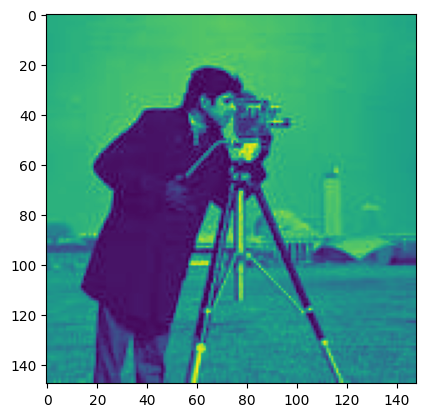

In [131]:
image = MyImage(path=CAMERAMAN, type=GRAYSCALE)
g_image15 = noise.add_guassian_noise(image, 0.05)
g_image50 = noise.add_guassian_noise(image, 0.1)
sp_image2 = noise.add_salt_pepper_noise(image, 0.05)
sp_image3 = noise.add_salt_pepper_noise(image, 0.1)
image.show_image()

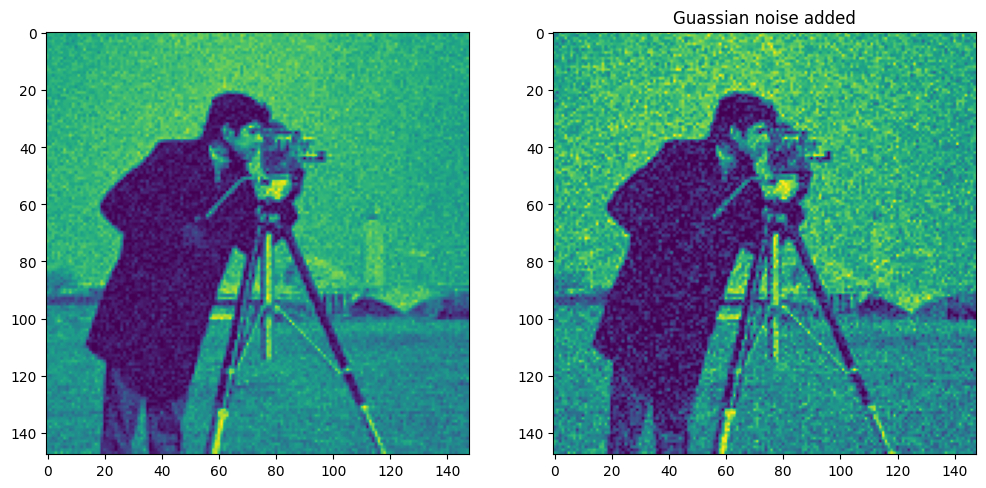

In [132]:
g_images = [g_image15, g_image50]
showImages(g_images, title="Guassian noise added")

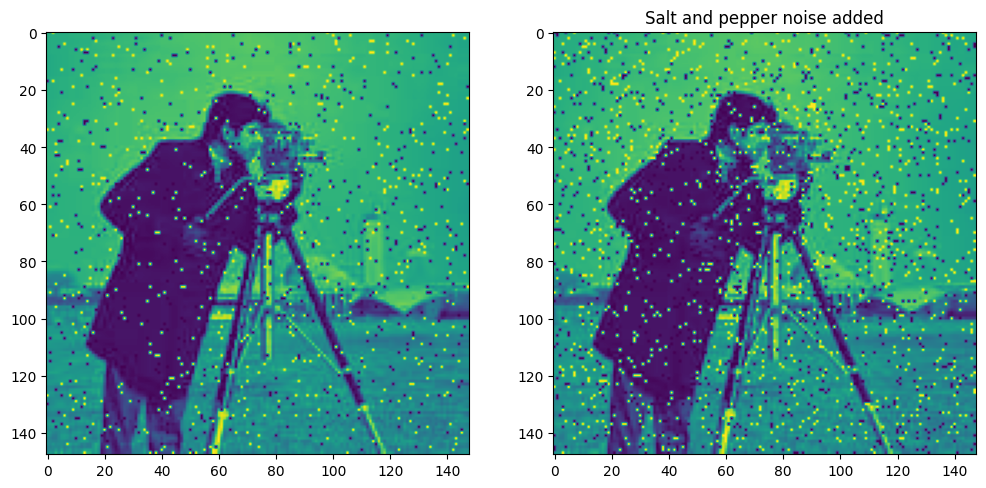

In [133]:
sp_images = [sp_image2, sp_image3]
showImages(sp_images, title="Salt and pepper noise added")

# Perform Median Filtering

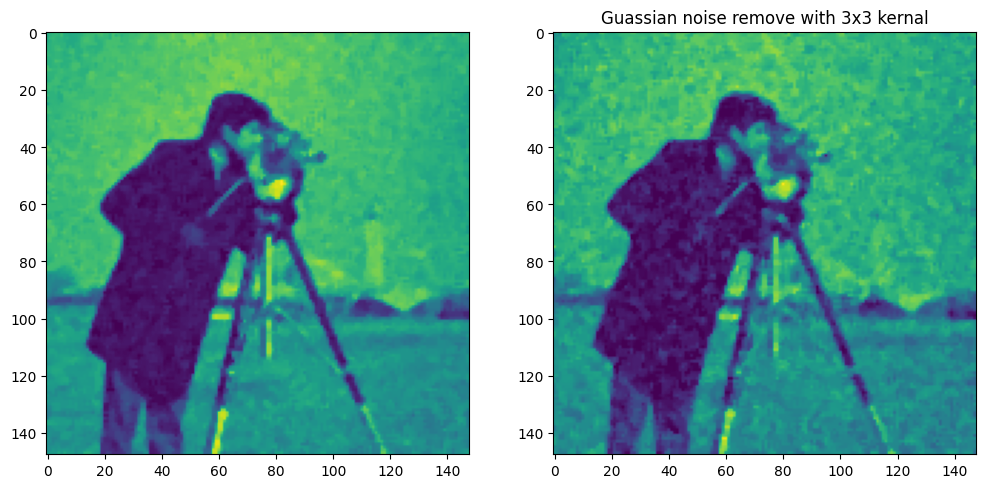

In [134]:
g_filtered_image = []
for image in g_images:
    g_filtered_image.append(median_filter.filter(image, 3))
showImages(g_filtered_image, title="Guassian noise remove with 3x3 kernal")

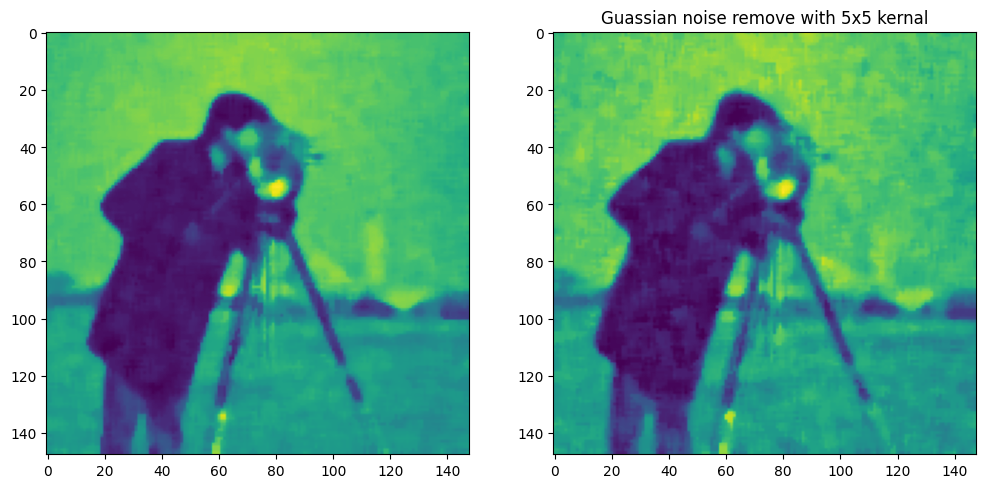

In [10]:
g_filtered_image = []
for image in g_images:
    g_filtered_image.append(median_filter.filter(image, 5))
showImages(g_filtered_image, title="Guassian noise remove with 5x5 kernal")

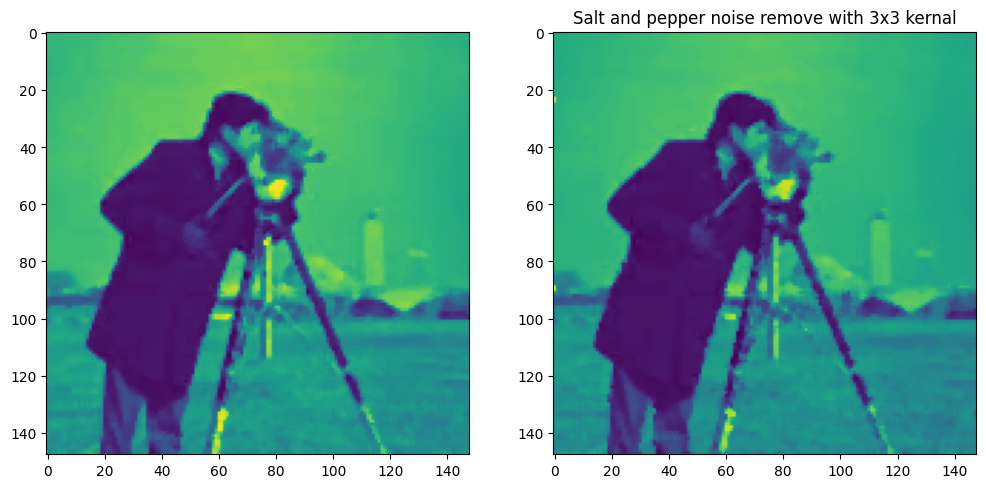

In [11]:
sp_filtered_image = []
for image in sp_images:
    sp_filtered_image.append(median_filter.filter(image, 3))
showImages(sp_filtered_image, title="Salt and pepper noise remove with 3x3 kernal")

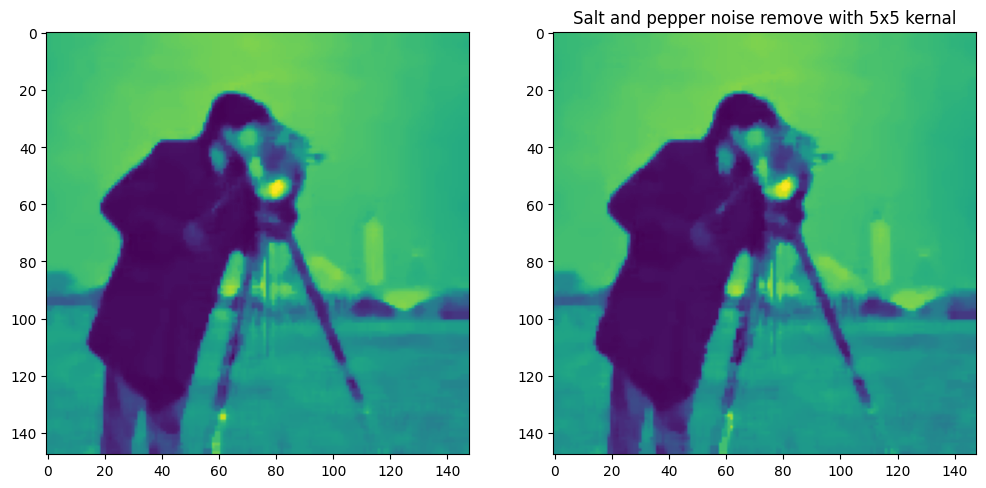

In [12]:
sp_filtered_image = []
for image in sp_images:
    sp_filtered_image.append(median_filter.filter(image, 5))
showImages(sp_filtered_image, title="Salt and pepper noise remove with 5x5 kernal")

## RGB Image


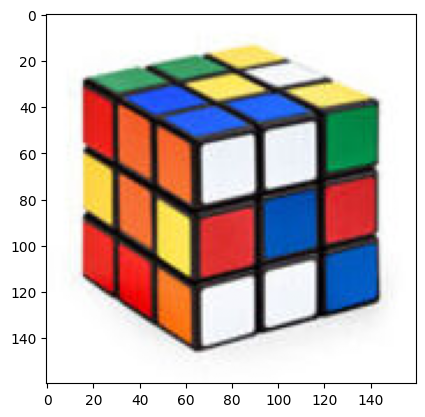

In [6]:
rgb_image = MyImage(path=RUBIKSCUBE, type=RGB)
rgb_g_image15 = noise.add_guassian_noise(rgb_image, 0.01)
rgb_g_image50 = noise.add_guassian_noise(rgb_image, 0.05)
rgb_sp_image2 = noise.add_salt_pepper_noise(rgb_image, 0.1)
rgb_sp_image3 = noise.add_salt_pepper_noise(rgb_image, 0.2)
rgb_image.show_image()

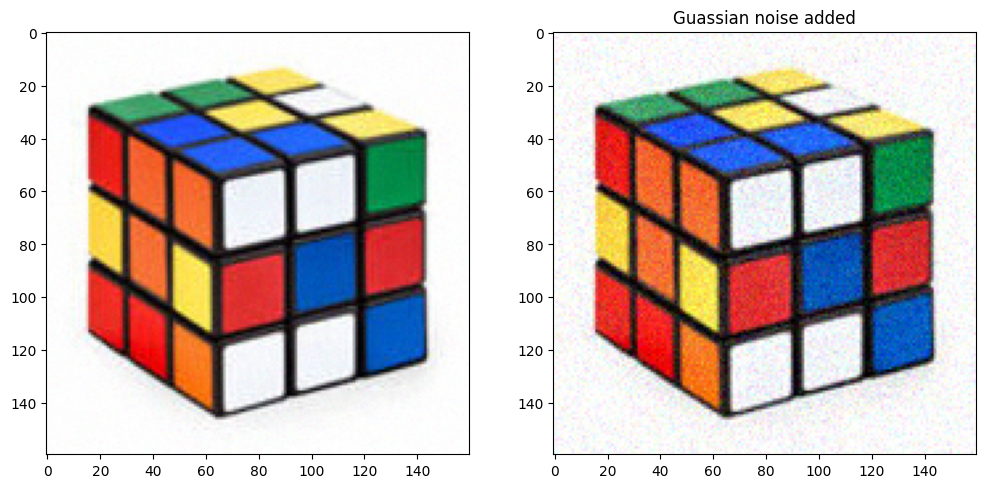

In [9]:
rgb_g_images = [rgb_g_image15, rgb_g_image50]
showImages(rgb_g_images, title="Guassian noise added")

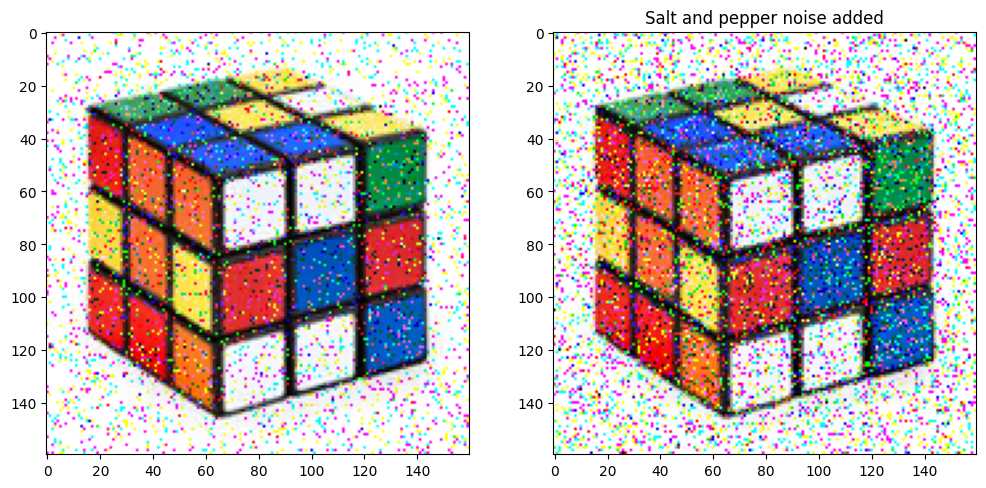

In [7]:
rgb_sp_images = [rgb_sp_image2, rgb_sp_image3]
showImages(rgb_sp_images, title="Salt and pepper noise added")

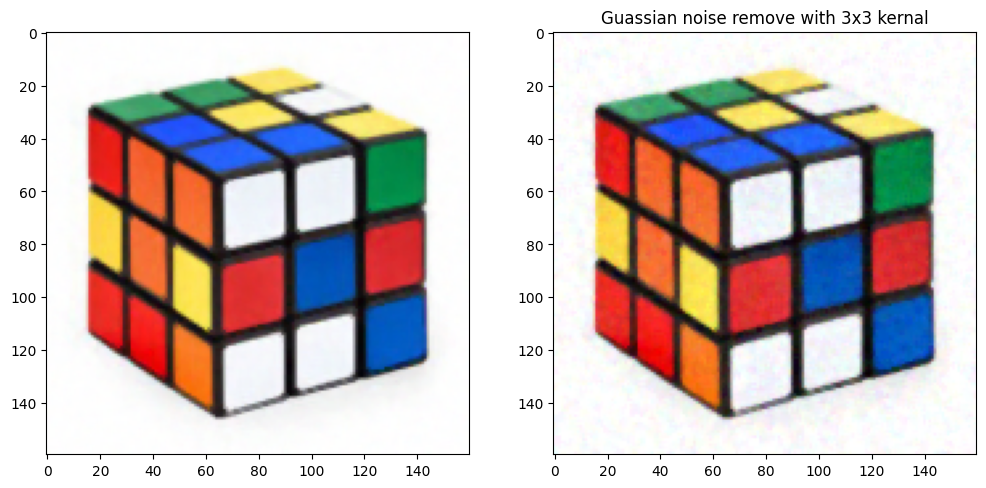

In [10]:
g_filtered_image = []
for image in rgb_g_images:
    g_filtered_image.append(median_filter.filter(image, 3))
showImages(g_filtered_image, title="Guassian noise remove with 3x3 kernal")

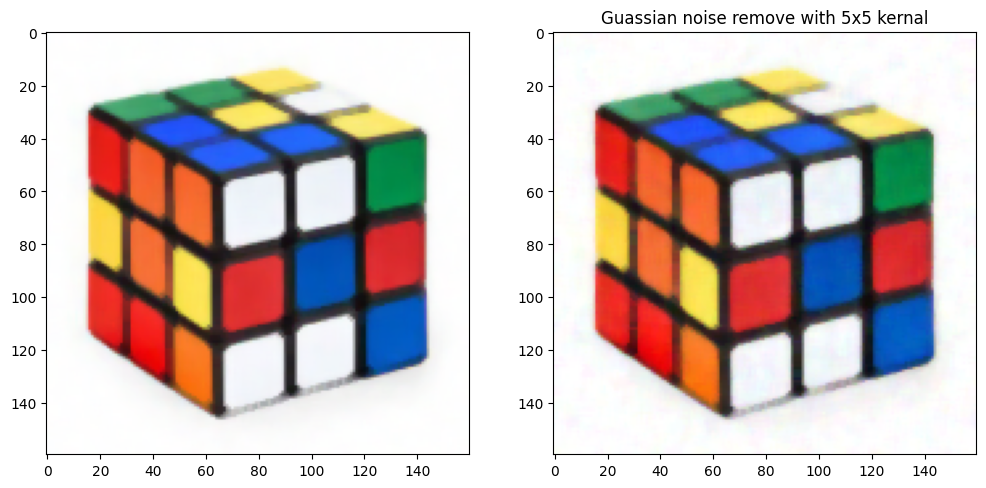

In [139]:
g_filtered_image = []
for image in rgb_g_images:
    g_filtered_image.append(median_filter.filter(image, 5))
showImages(g_filtered_image, title="Guassian noise remove with 5x5 kernal")

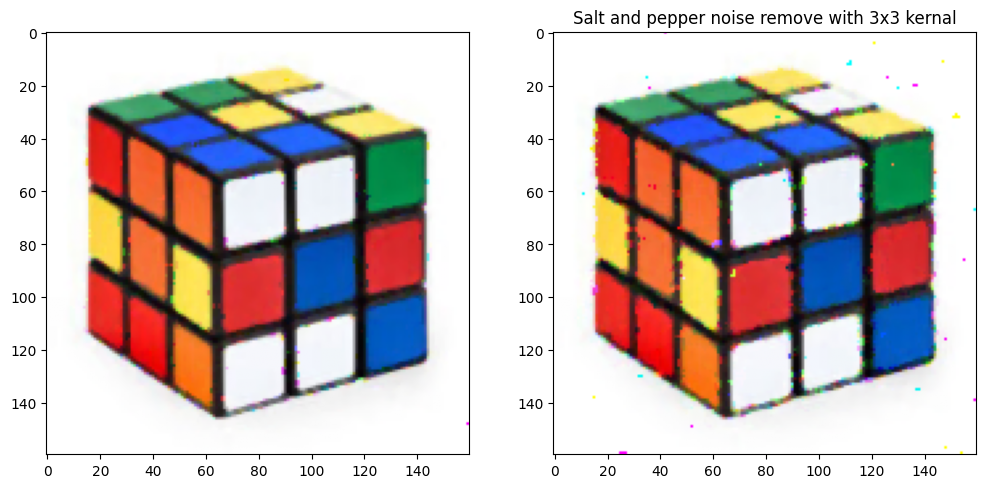

In [11]:
sp_filtered_image = []
for image in rgb_sp_images:
    sp_filtered_image.append(median_filter.filter(image, 3))
showImages(sp_filtered_image, title="Salt and pepper noise remove with 3x3 kernal")

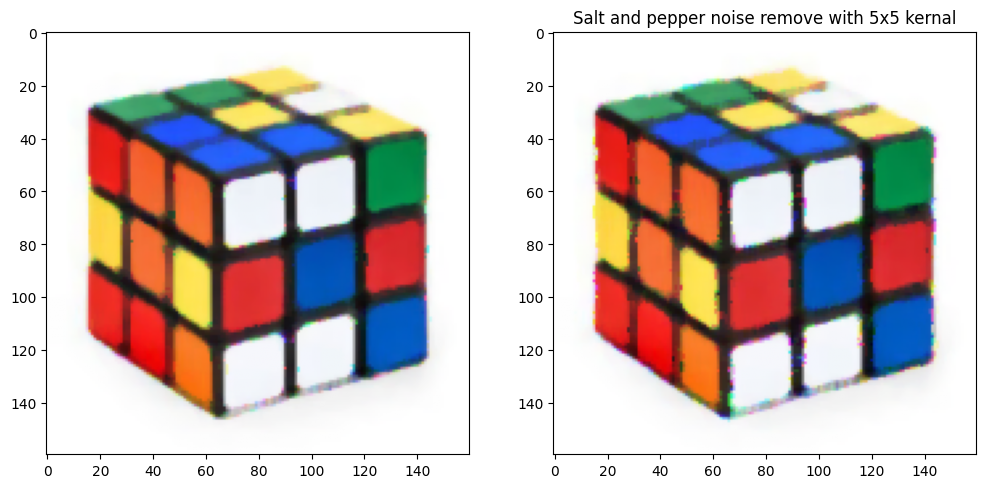

In [141]:
sp_filtered_image = []
for image in rgb_sp_images:
    sp_filtered_image.append(median_filter.filter(image, 5))
showImages(sp_filtered_image, title="Salt and pepper noise remove with 5x5 kernal")

# Multi-Programming and Threading 

since,

In [12]:
multiprocessing.cpu_count()

4

- Since total cpu count is 4 and maximum channel in image are 3 so we can use 3 process running on different cpu for each channel.
- Further each channel, calculation of one pixel is independent of another so we can divide each process into multiple threads.

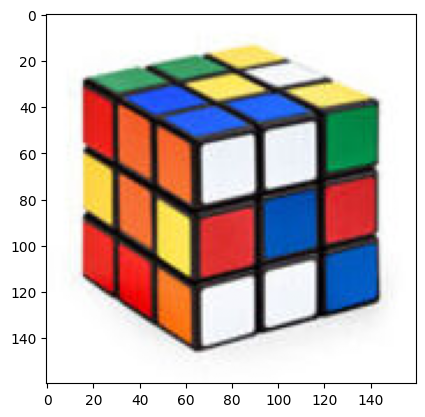

In [2]:
rgb_image = MyImage(path=RUBIKSCUBE, type=RGB)
# rgb_g_image15 = noise.add_guassian_noise(rgb_image, 0.01)
# rgb_g_image50 = noise.add_guassian_noise(rgb_image, 0.05)
rgb_sp_image2 = noise.add_salt_pepper_noise(rgb_image, 0.1)
rgb_sp_image3 = noise.add_salt_pepper_noise(rgb_image, 0.2)
rgb_image.show_image()

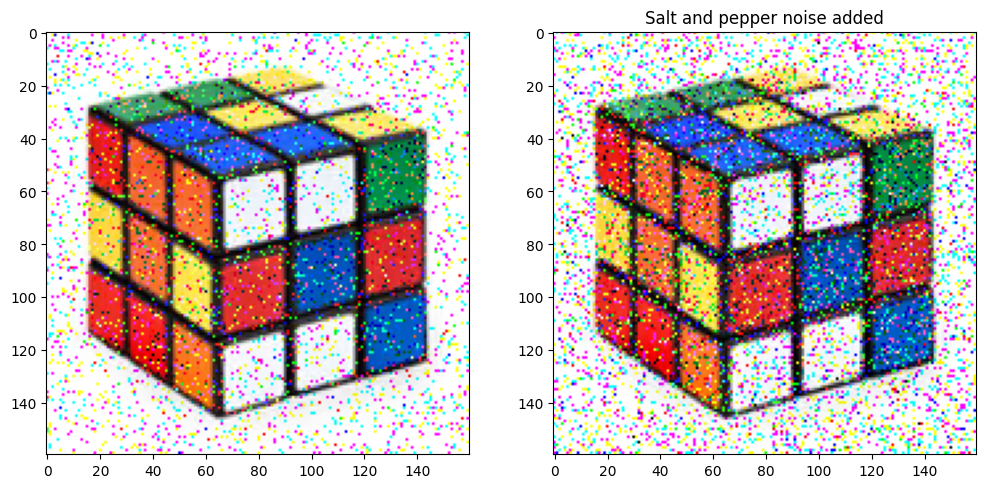

In [3]:
rgb_sp_images = [rgb_sp_image2, rgb_sp_image3]
showImages(rgb_sp_images, title="Salt and pepper noise added")

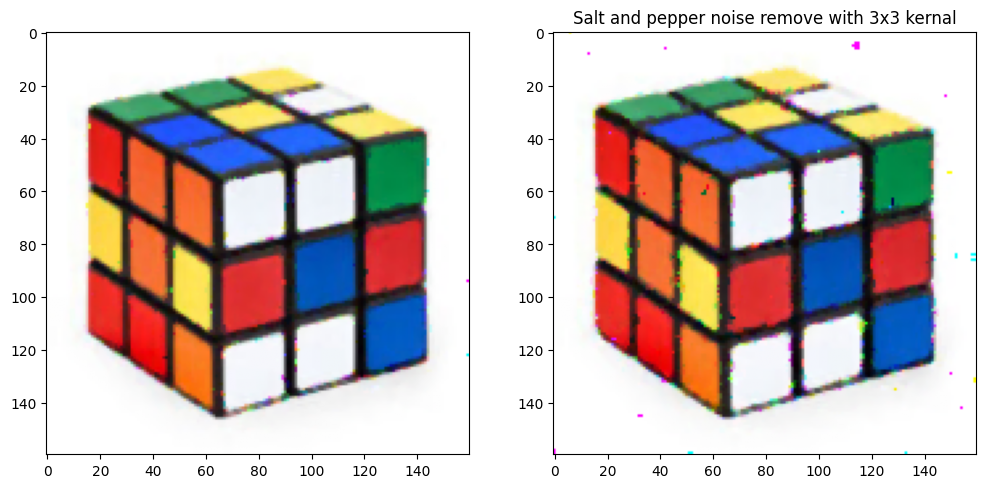

In [4]:
sp_filtered_image = []
for image in rgb_sp_images:
    sp_filtered_image.append(parallel_median_filter.filter(image, 3))
showImages(sp_filtered_image, title="Salt and pepper noise remove with 3x3 kernal")

# Bilateral Filter

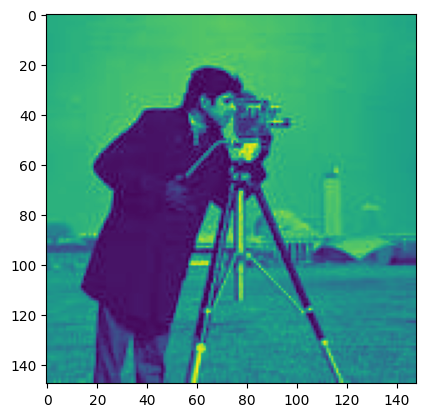

In [123]:
image = MyImage(path=CAMERAMAN, type=GRAYSCALE)
g_image15 = noise.add_guassian_noise(image, 0.05)
g_image50 = noise.add_guassian_noise(image, 0.1)
image.show_image()

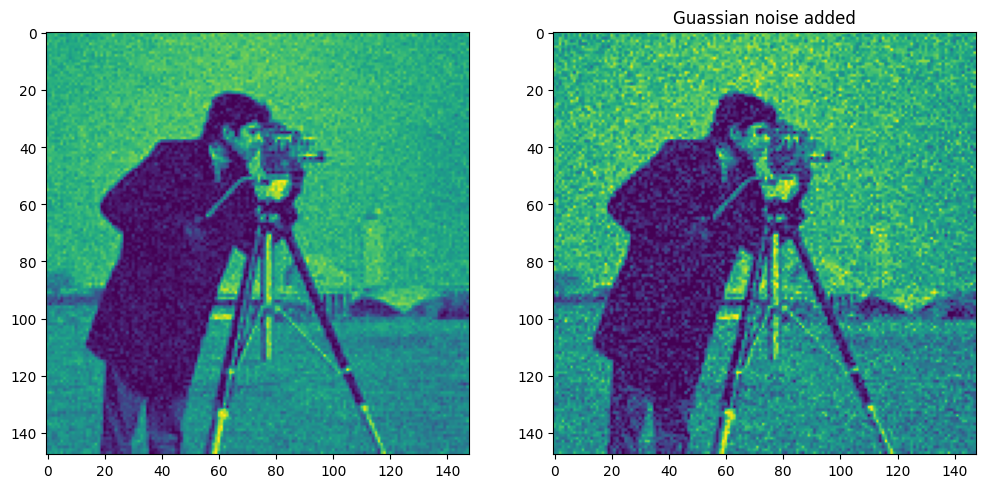

In [124]:
g_images = [g_image15, g_image50]
showImages(g_images, title="Guassian noise added")

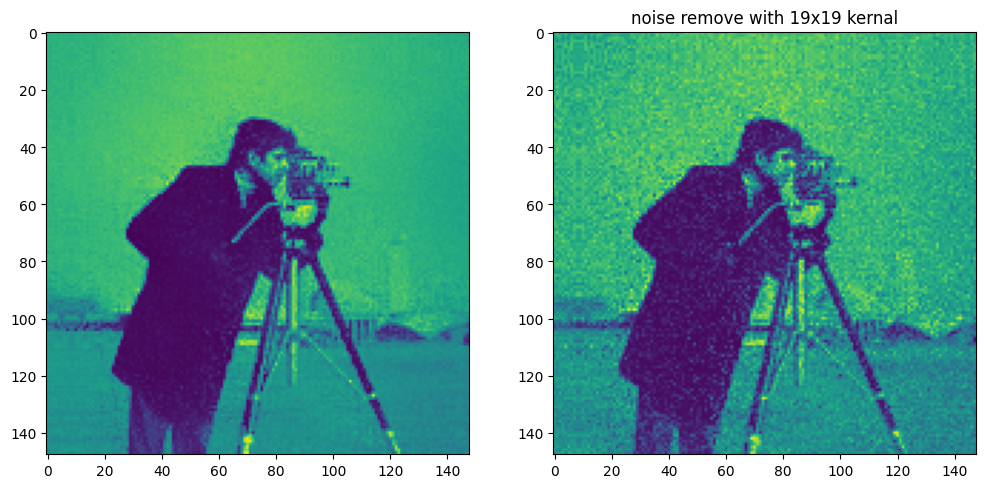

In [125]:
g_filtered_image = []
for image in g_images:
    image.data = image.data*255
    g_filtered_image.append(bilateral_filter.filter(image, 19 , 3, 25))
showImages(g_filtered_image, title="noise remove with 19x19 kernal")

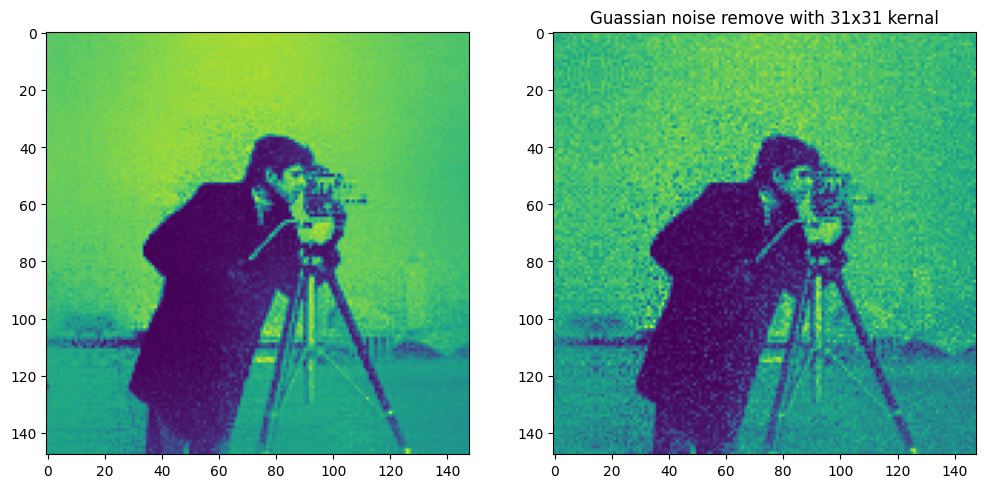

In [126]:
g_filtered_image = []
for image in g_images:
    g_filtered_image.append(bilateral_filter.filter(image, 31 ,5, 35))
showImages(g_filtered_image, title="Guassian noise remove with 31x31 kernal")